### Show Fonts 

Show all Fonts to create a blacklist. The blacklisted fonts in /datasets/font-blacklist.txt will be ignored.

In [4]:
import tensorflow as tf
import numpy as np
import pandas as pd

def tmnist_percentals():
    x_train = np.empty((1,32,20,3))
    y_train = np.empty((1,1))

    blacklist_url = "datasets/font-blacklist.txt"
    blacklist_data = pd.read_csv(blacklist_url, index_col=False)
    
    for i in range(29):

        dataset_url = "datasets/TMNIST_PERCENTAL_"+str((i+1)*1000)+"_Data.csv"
        data = pd.read_csv(dataset_url, index_col=False)
        data = data.drop(data[data['names'].isin(blacklist_data.values.reshape(-1))].index)
        
        data = data.loc[data['labels']==0]
        #print(data.head())
        y_tmnist = data[['names']]
        X = data.drop({'labels','names'},axis=1)

        #print(data)
        X_images = (255-(X.values.reshape(-1,28,28,1)))/255.
        x_tmnist = tf.image.grayscale_to_rgb(tf.convert_to_tensor(X_images))
        x_tmnist = tf.image.resize(x_tmnist, (32,20))

        x_train = np.concatenate((x_tmnist, x_train))
        y_train = np.concatenate((y_tmnist.values, y_train))
        #print(x_tmnist.shape, np.array(y_tmnist).shape)
    return x_train,  y_train

In [5]:
x_train, y_train = tmnist_percentals()
len(y_train)

Metal device set to: Apple M1 Pro

systemMemory: 32.00 GB
maxCacheSize: 10.67 GB



2022-05-17 20:23:59.169709: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-05-17 20:23:59.169889: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


2858

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from textwrap import wrap

def plot_dataset(images, labels, columns=12, rows=5):

    fig = plt.figure(figsize=(1.4*columns, 2*rows))
    
    for i in range(1, columns*rows +1):
        if (i>len(labels)):
            break
        fig.add_subplot(rows, columns, i)
        plt.axis("off")
        title = str(labels[i-1].reshape(-1))
        plt.title("\n".join(wrap(title, 15)))  # set title
        plt.imshow((images[i-1]), aspect='auto')
        plt.tight_layout()
    plt.show()

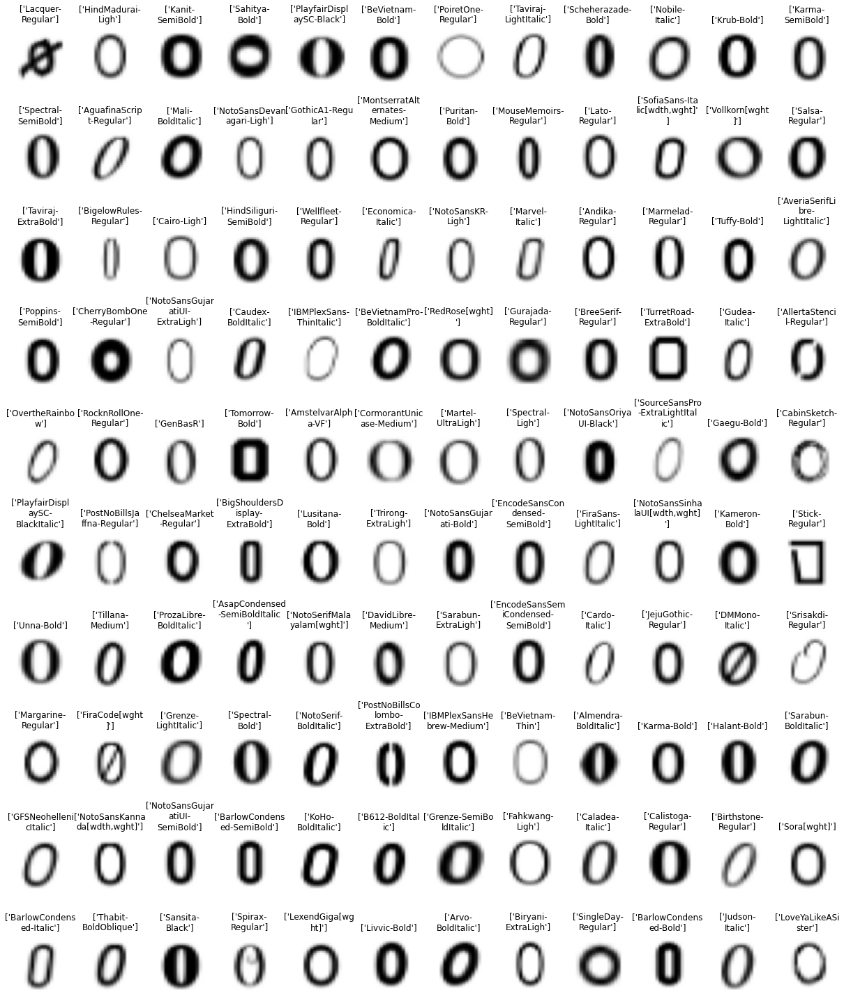

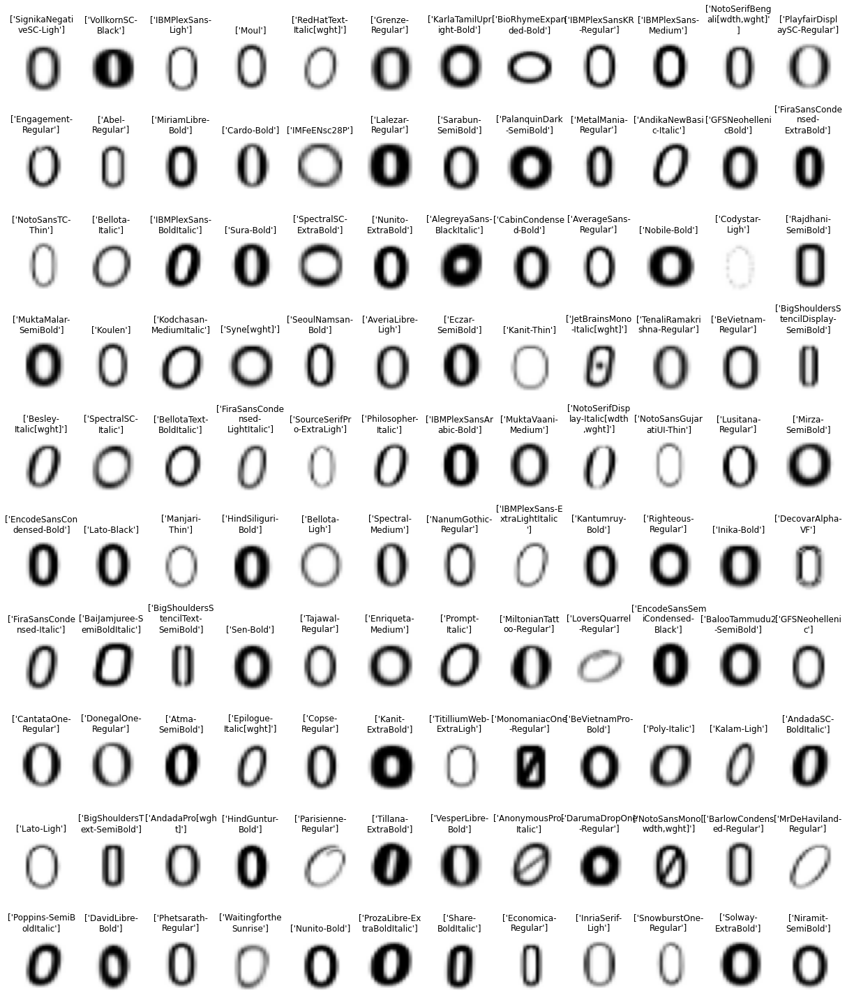

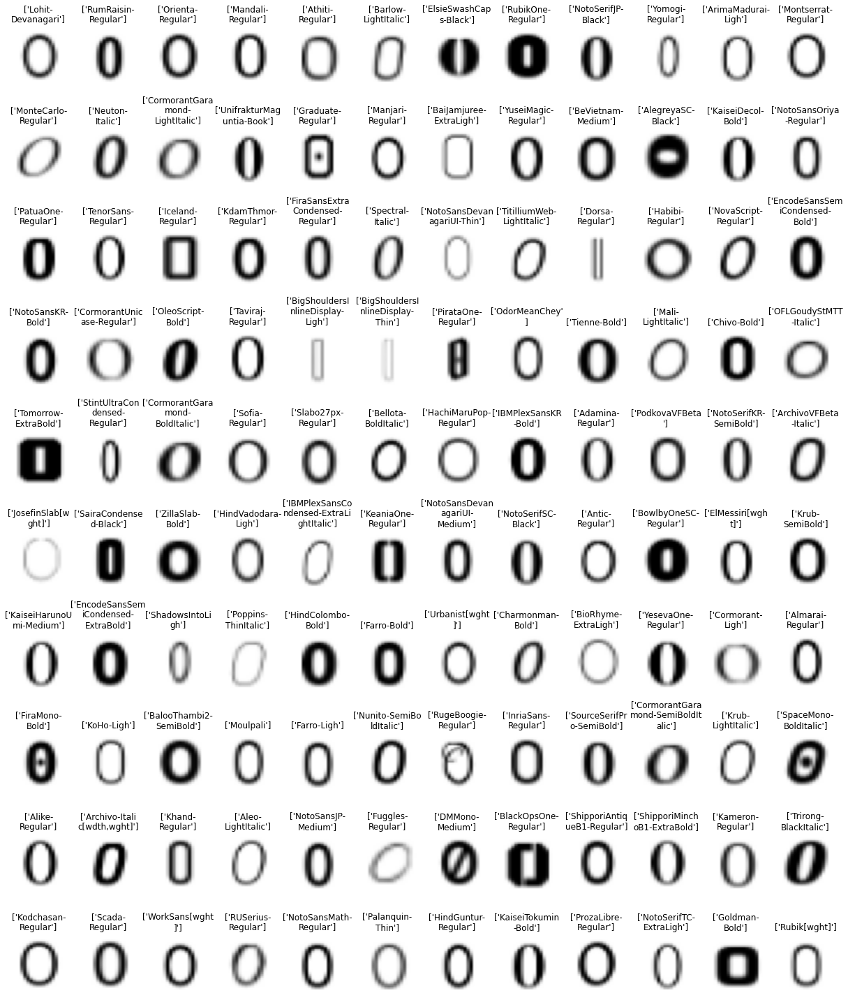

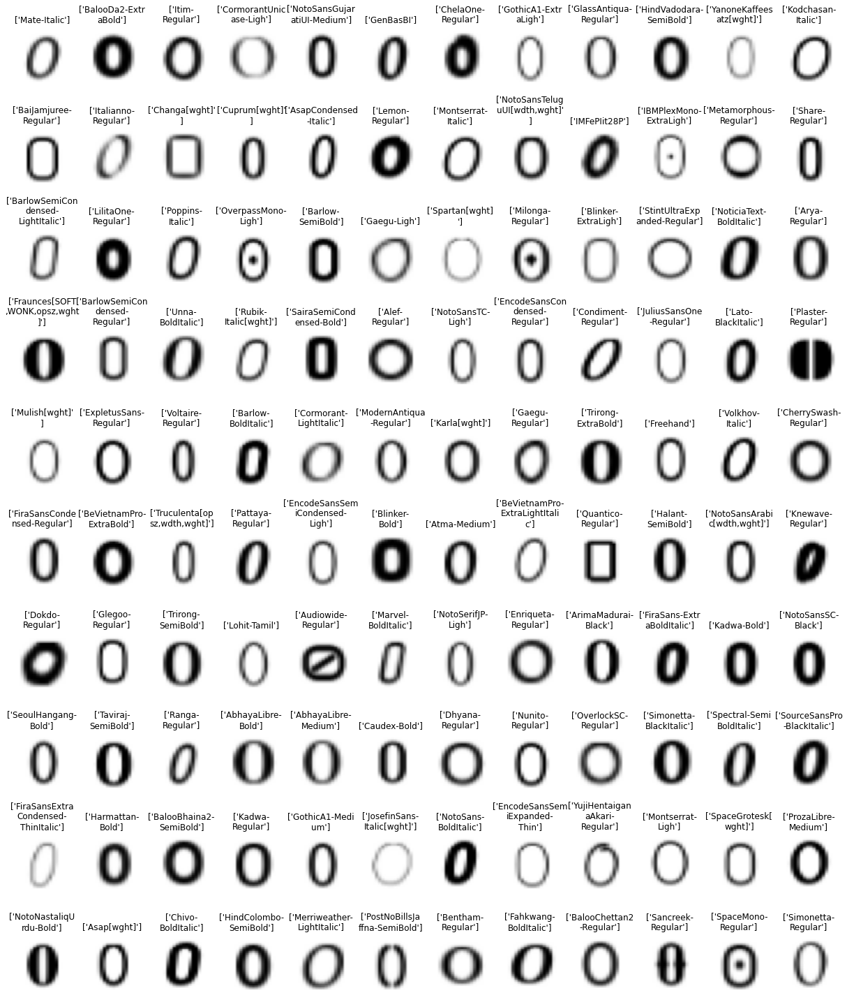

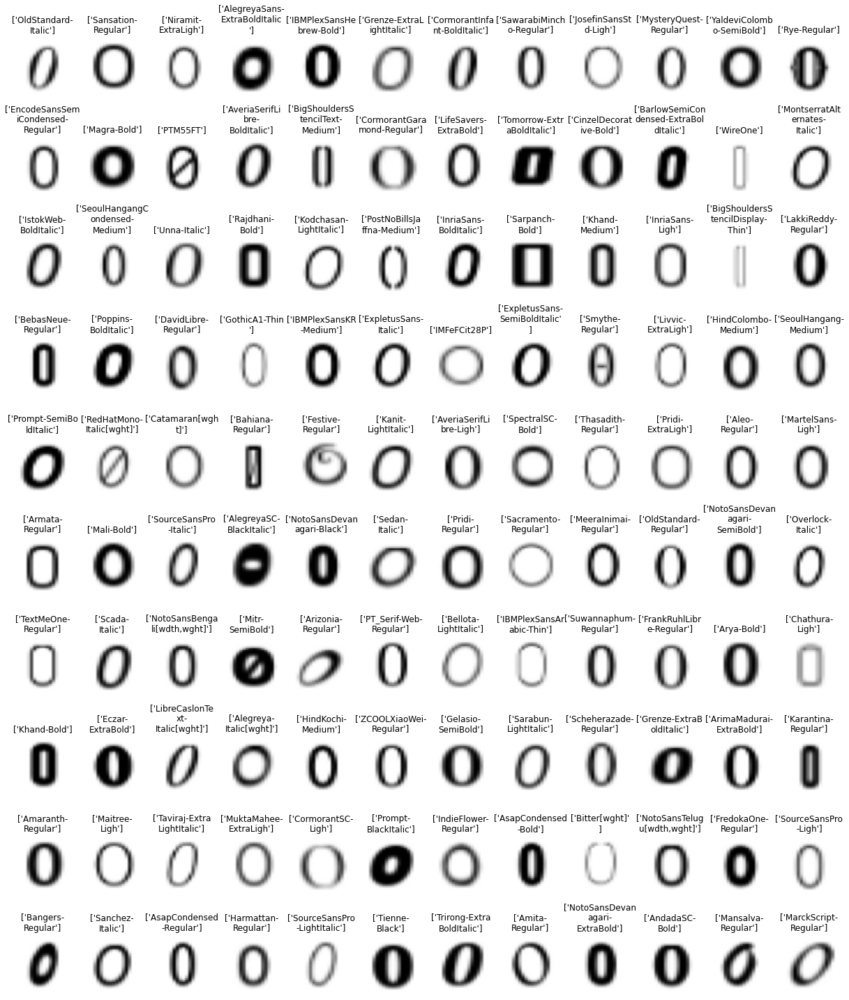

...

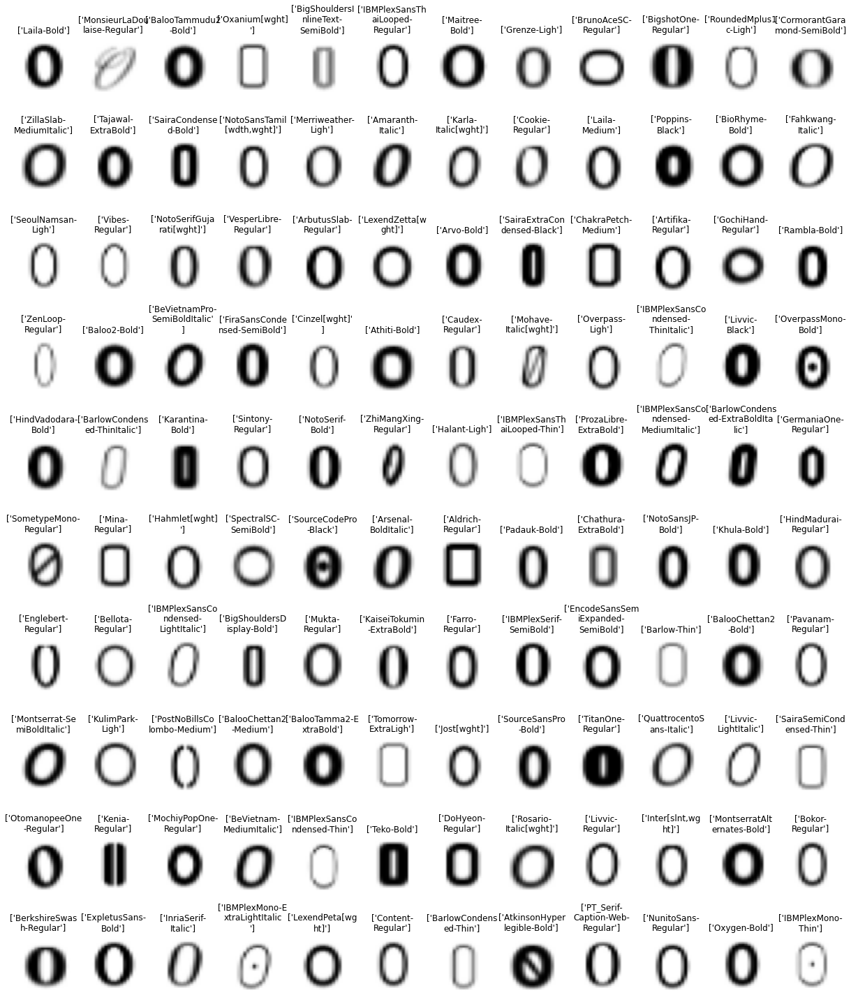

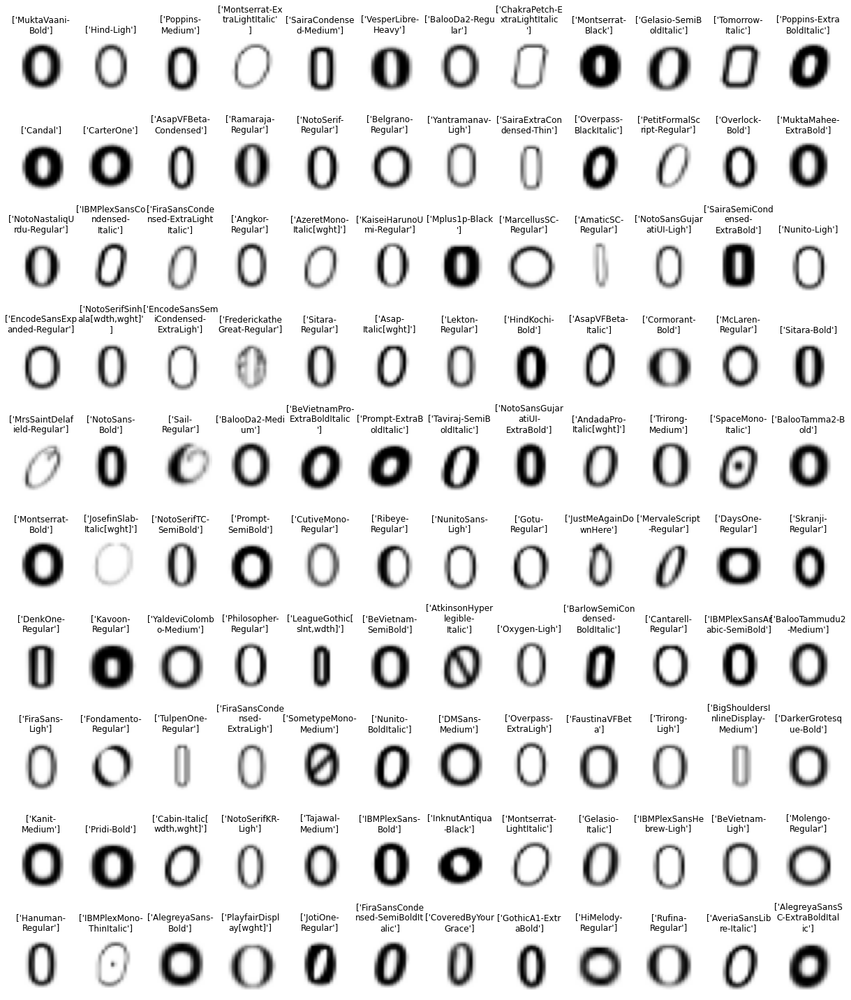

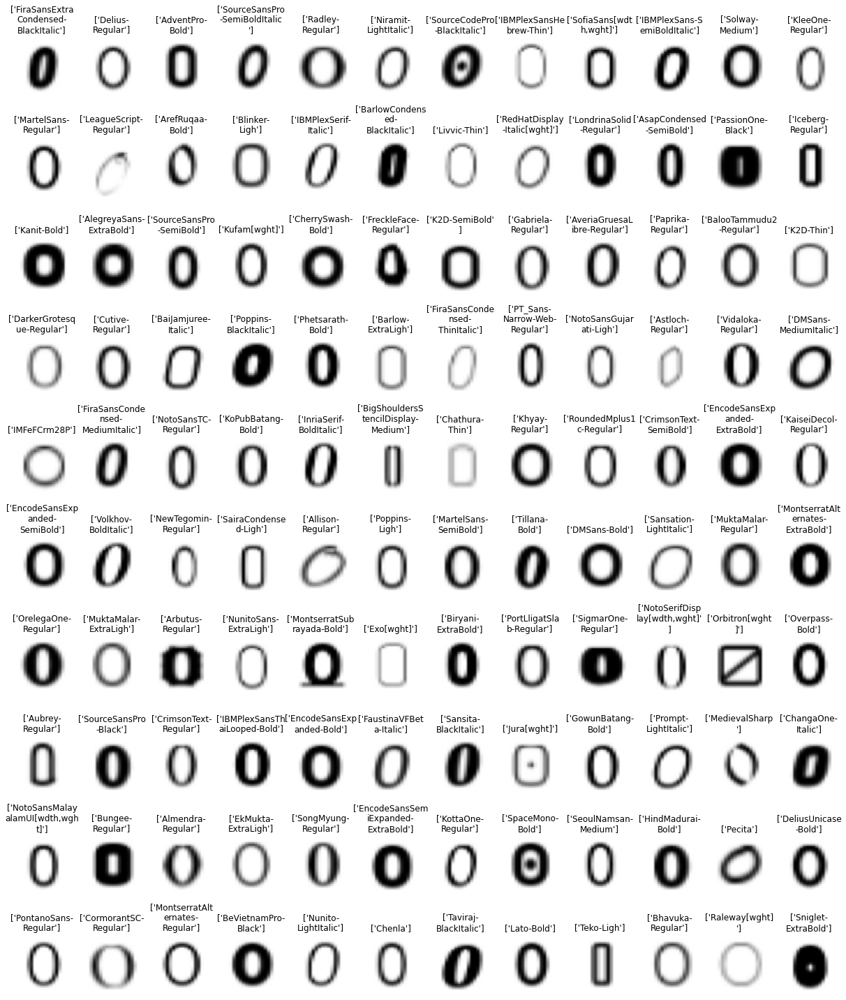

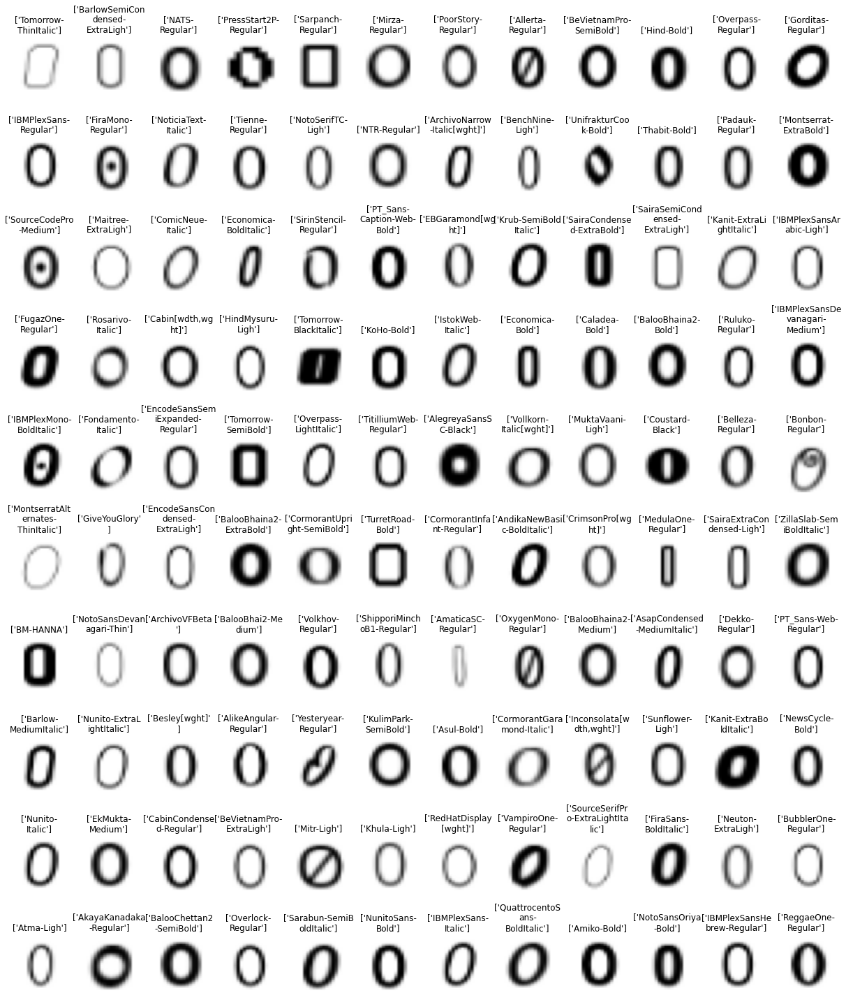

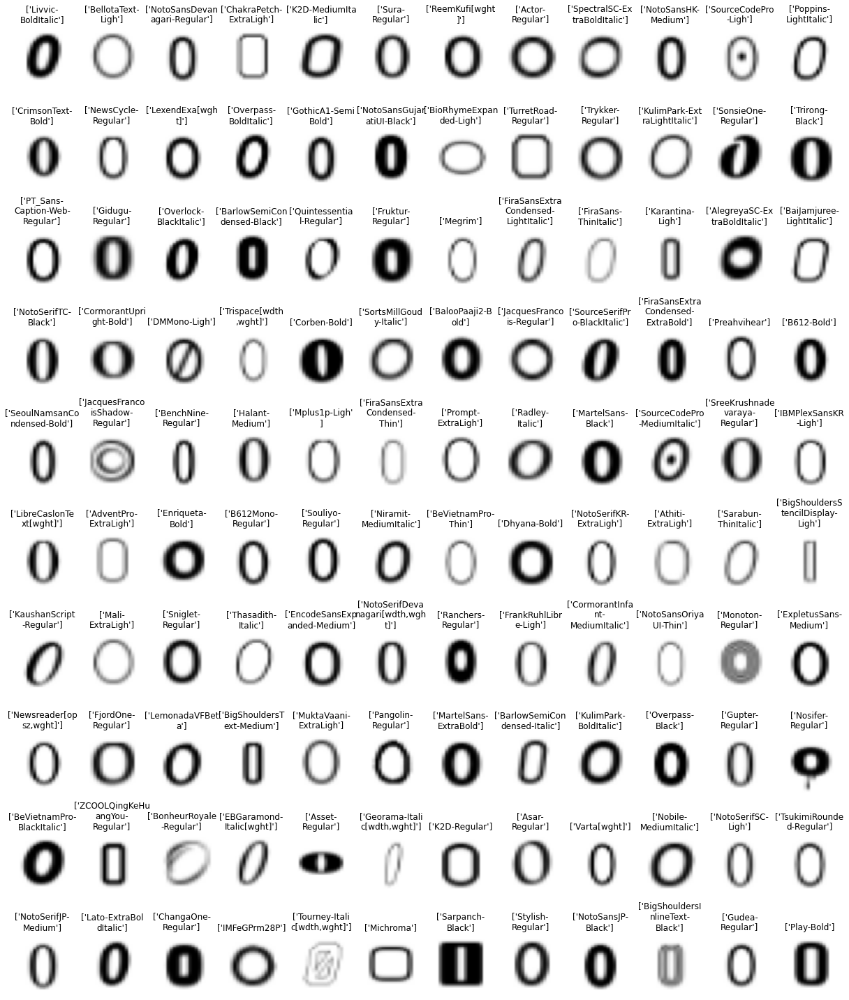

In [7]:
columns = 12
rows = 10
oneplot_items = columns * rows

for i in range(int(len(y_train)/oneplot_items)):
    plot_dataset(x_train[i*oneplot_items:(i+1)*oneplot_items, ], y_train[i*oneplot_items:(i+1)*oneplot_items, ], columns=12, rows=10)